In [1]:
import polars as pl
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
import gc
from tqdm import tqdm

In [2]:
BASE_PATH = Path('/kaggle/input/jane-street-real-time-market-data-forecasting/train.parquet')

train_ds = pl.concat([
    pl.scan_parquet(BASE_PATH / f'partition_id={i}' / 'part-0.parquet')
    for i in range(10)
])

100%|██████████| 9/9 [22:59<00:00, 153.26s/it]


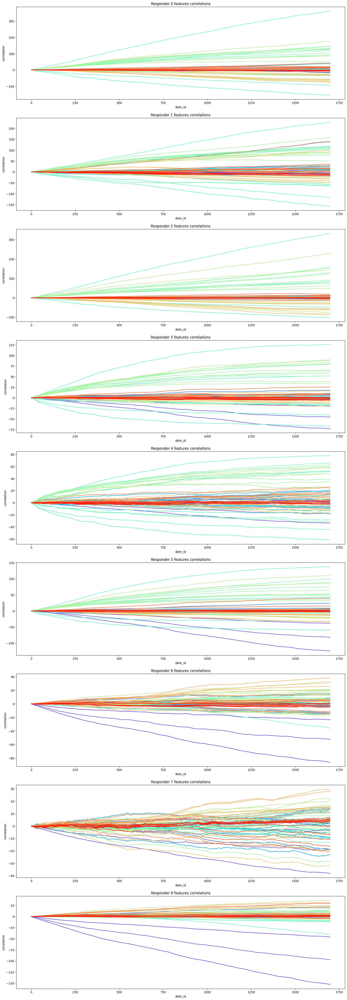

In [3]:
from matplotlib import cm

colors = [cm.rainbow(i / 79)[:3] for i in range(79)]
fig, axes = plt.subplots(9, 1, figsize=(20, 60))

for i in tqdm(range(9)):
    for j in range(79):
        plot_df = train_ds.select(['date_id', f'responder_{i}', f'feature_{j:02d}']).fill_null(0) \
            .group_by('date_id').agg(pl.corr(f'feature_{j:02d}', f'responder_{i}')) \
            .sort('date_id').collect()
        axes[i].plot(plot_df['date_id'].to_numpy(), plot_df[f'feature_{j:02d}'].to_numpy().cumsum(), color=colors[j])
    axes[i].set_xlabel('date_id')
    axes[i].set_ylabel('correlation')
    axes[i].set_title(f'Responder {i} features correlations')
    
plt.show()

100%|██████████| 39/39 [23:12<00:00, 35.69s/it]


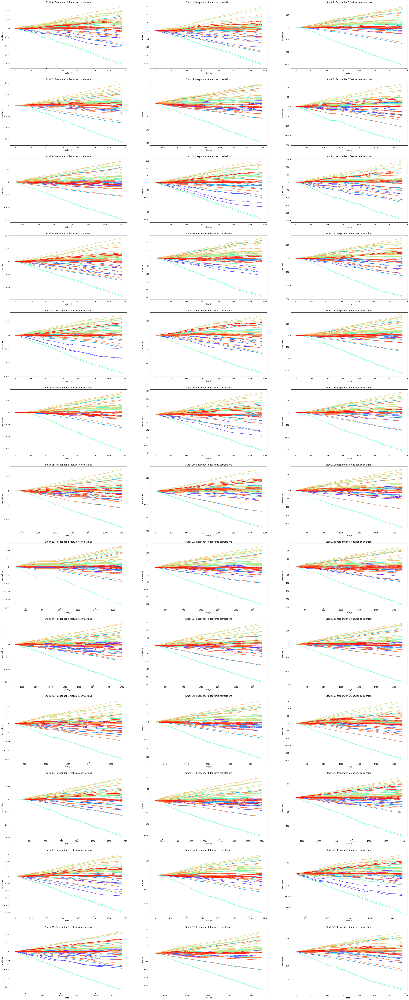

In [4]:
fig, axes = plt.subplots(13, 3, figsize=(40, 100))
axes = axes.flatten()

for i in tqdm(range(39)):
    for j in range(79):
        plot_df = train_ds.filter(pl.col('symbol_id') == i) \
            .select(['date_id', 'responder_6', f'feature_{j:02d}']).fill_null(0) \
            .group_by('date_id').agg(pl.corr(f'feature_{j:02d}', 'responder_6')) \
            .sort('date_id').collect()
        axes[i].plot(plot_df['date_id'].to_numpy(), plot_df[f'feature_{j:02d}'].to_numpy().cumsum(), color=colors[j])
    axes[i].set_xlabel('date_id')
    axes[i].set_ylabel('correlation')
    axes[i].set_title(f'Stock {i}: Responder 6 features correlations')
    
plt.show()